# Detectron2 Beginner's Tutorial

<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="500">

Welcome to detectron2! This is the official colab tutorial of detectron2. Here, we will go through some basics usage of detectron2, including the following:
* Run inference on images or videos, with an existing detectron2 model
* Train a detectron2 model on a new dataset

You can make a copy of this tutorial by "File -> Open in playground mode" and make changes there. __DO NOT__ request access to this tutorial.


# Install detectron2

In [1]:
#!python -m pip install pyyaml==5.1
#import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
#!git clone 'https://github.com/facebookresearch/detectron2'
#dist = distutils.core.run_setup("./detectron2/setup.py")
#!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
#sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-_xn51q2w
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-_xn51q2w
  Resolved https://github.com/facebookresearch/detectron2.git to commit b7c7f4ba82192ff06f2bbb162b9f67b00ea55867
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 1.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 17.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 16.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for detectron2: filename=detectron2-0.6-cp310-cp310-linux_x86_64.whl size=6147749 sha256=f75037afbe75ed786d0e9dd3e1954

In [3]:
# Some basic setup:
# Setup detectron2 logger
import torch
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog


!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
torch:  2.2 ; cuda:  cu121
detectron2: 0.6


In [4]:


# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow



# import some common coco utilities
from pycocotools.coco import COCO
import requests
import matplotlib.pyplot as plt
import urllib.request
from PIL import Image

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Run a pre-trained detectron2 model

We first download an image from the COCO dataset:

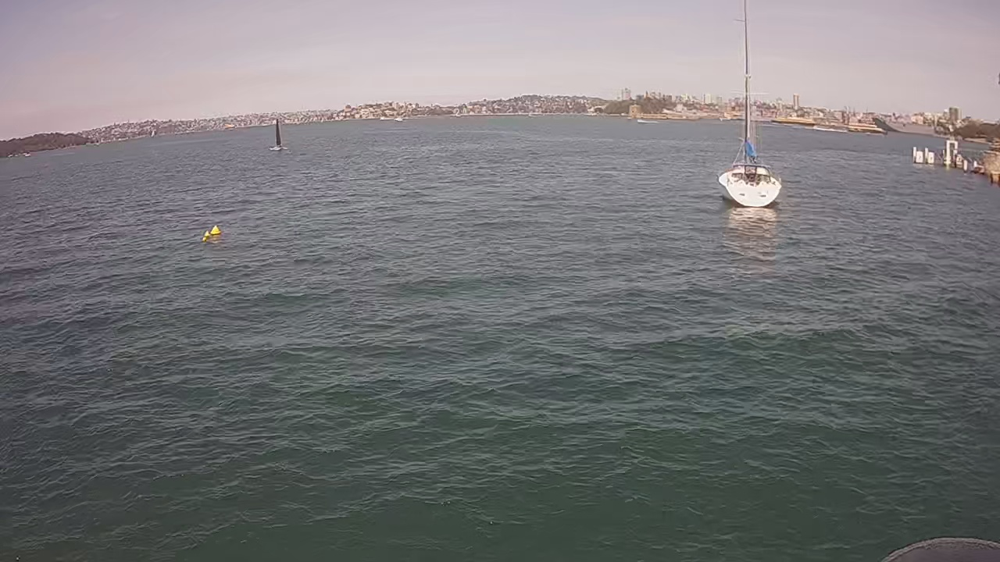

In [ ]:
im = cv2.imread("/content/2021-10-09 02-35-00.jpg")
cv2_imshow(im)


Then, we create a detectron2 config and a detectron2 `DefaultPredictor` to run inference on this image.

In [ ]:
cfg = get_cfg()

# 导入 RetinaNet 配置
# cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_50_FPN_3x.yaml"))
# cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/retinanet_R_50_FPN_3x.yaml")

# # 导入 Faster R-CNN 配置
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")

# # 导入 SSD 配置
# cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/ssd300_vgg16.yaml"))
# cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/ssd300_vgg16.yaml")

cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
predictor = DefaultPredictor(cfg)
outputs = predictor(im)

[04/11 15:32:43 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-Detection/retinanet_R_50_FPN_3x/190397829/model_final_5bd44e.pkl ...


model_final_5bd44e.pkl: 152MB [00:00, 205MB/s]                           
  pixel_mean
  pixel_std
/usr/local/lib/python3.10/dist-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3549.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [ ]:
# look at the outputs. See https://detectron2.readthedocs.io/tutorials/models.html#model-output-format for specification
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)

tensor([ 8,  8,  8,  8,  8,  8,  8,  8,  8,  8, 14,  8,  8,  8,  8,  8,  8,  0,
         0,  8,  8, 32,  8,  8,  8,  8,  0,  8,  8,  8,  8,  8, 33,  8,  8,  0,
         8,  8,  0,  8,  8,  8,  8,  0,  8,  0,  8, 29,  8,  8,  8,  0, 14,  8,
         0,  0,  0,  8, 47,  8,  8,  8,  8,  8,  8,  8,  8,  0,  0,  8,  8,  8,
         8, 25,  8,  8,  8,  8,  8,  8, 14,  8,  8,  8,  0,  8,  8,  8,  0,  8,
         8,  8,  8,  8,  8,  8,  0, 46,  8,  0], device='cuda:0')
Boxes(tensor([[ 341.5717,  151.7381,  368.5954,  193.5360],
        [ 917.9904,    2.6144, 1001.4056,  267.6438],
        [1170.7473,  187.5399, 1182.9301,  209.7177],
        [ 918.5103,  212.2829, 1001.3776,  265.1799],
        [1174.7892,  187.3118, 1188.7565,  209.7279],
        [ 987.4906,  119.3676, 1043.0234,  163.8787],
        [ 986.2189,  142.3572, 1043.9309,  162.8613],
        [ 805.2779,  140.9615,  825.0304,  154.6297],
        [1036.0883,  147.7293, 1134.5474,  172.9611],
        [1180.5271,  188.2224, 1193.0525, 

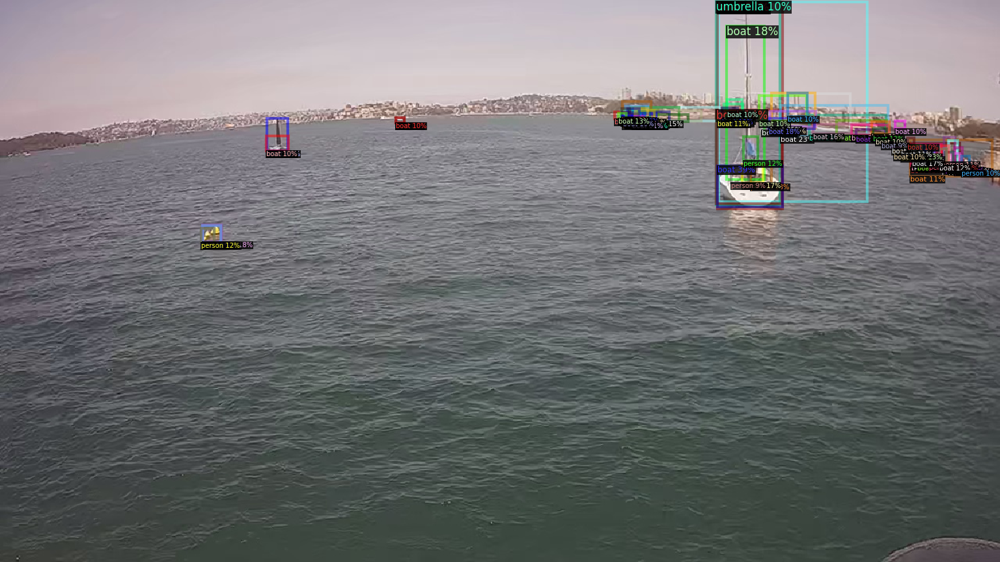

In [ ]:
# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

# Train on a custom dataset

In this section, we show how to train an existing detectron2 model on a custom dataset in a new format.



## Prepare the dataset

In [9]:
# 安装pycocotools，这个库提供了读取和处理COCO数据集的工具
!pip install pycocotools

# COCO数据集的URL地址，这里以2017年训练集的注释为例
annotations_url = 'http://images.cocodataset.org/annotations/annotations_trainval2017.zip'
annotations_zip_path = '/content/drive/MyDrive/annotations_trainval2017.zip'
annotations_dir_path = '/content/drive/MyDrive/'

# 下载并解压注释文件
if not os.path.exists(annotations_zip_path):
    annotations_zip = requests.get(annotations_url)
    open(annotations_zip_path, 'wb').write(annotations_zip.content)
    !unzip -q {annotations_zip_path} -d {annotations_dir_path}

# 初始化COCO API
coco = COCO('/content//drive/MyDrive/annotations/instances_train2017.json')




ERROR: Operation cancelled by user
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pip/_vendor/pkg_resources/__init__.py", line 3108, in _dep_map
    return self.__dep_map
  File "/usr/local/lib/python3.10/dist-packages/pip/_vendor/pkg_resources/__init__.py", line 2901, in __getattr__
    raise AttributeError(attr)
AttributeError: _DistInfoDistribution__dep_map

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/cli/base_command.py", line 169, in exc_logging_wrapper
    status = run_func(*args)
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/cli/req_command.py", line 242, in wrapper
    return func(self, options, args)
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/commands/install.py", line 441, in run
    conflicts = self._determine_conflicts(to_install)
  File "/usr/local/lib/python3.10/dist-packages/pip/_i

Exception ignored in: <function _xla_gc_callback at 0x79015bcea200>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/jax/_src/lib/__init__.py", line 98, in _xla_gc_callback
    def _xla_gc_callback(*args):
KeyboardInterrupt: 


Done (t=24.33s)
creating index...
index created!


In [ ]:
# 获取所有类别
categories = coco.loadCats(coco.getCatIds())

# 打印类别名称
for category in categories:
    print(category['id'], category['name'])


In [10]:
# 假设我们对“船”和“人”的类别感兴趣
interested_categories = ['boat', 'airplane', 'bird', 'kite', 'surfboard']

# 获取这些类别的ID
catIds = coco.getCatIds(catNms=interested_categories)

# 分别获取每个类别的图像ID
imgIds = []
for catId in catIds:
    imgIds.extend(coco.getImgIds(catIds=[catId]))

# 移除重复的图像ID
imgIds = list(set(imgIds))

# 创建一个目录来保存下载的图像
os.makedirs('/content/drive/MyDrive/cocoimages', exist_ok=True)

# 下载图像
for imgId in imgIds:
    img_info = coco.loadImgs(imgId)[0]
    img_url = img_info['coco_url']
    img_filename = os.path.join('/content/drive/MyDrive/cocoimages', img_info['file_name'])
    if not os.path.exists(img_filename):  # 检查图像是否已经下载
        urllib.request.urlretrieve(img_url, img_filename)


In [11]:
# 加载这些图像的信息
images = coco.loadImgs(imgIds)

print(f"Found {len(images)} images containing either category: {interested_categories}")

Found 14102 images containing either category: ['boat', 'airplane', 'bird', 'kite', 'surfboard']


In [12]:
!ls /content/drive/MyDrive/cocoimages | wc -l

14102


In [10]:
from pycocotools.coco import COCO
from detectron2.structures import BoxMode
import os

thing_classes = ["airplane", "boat", "bird", "kite", "surfboard"]

def get_coco_dicts_filtered_by_categories(img_dir, json_file, categories):
    coco_api = COCO(json_file)
    # 获取感兴趣类别的类别ID
    cat_ids = coco_api.getCatIds(catNms=categories)

    dataset_dicts = []
    for img_id in coco_api.imgs:
        img_info = coco_api.imgs[img_id]
        ann_ids = coco_api.getAnnIds(imgIds=[img_id], catIds=cat_ids, iscrowd=None)
        anns = coco_api.loadAnns(ann_ids)

        # 只包括感兴趣的类别的标注
        filtered_anns = [ann for ann in anns if ann['category_id'] in cat_ids]
        if not filtered_anns:  # 如果没有感兴趣的类别的标注，跳过这张图片
            continue

        record = {
            "file_name": os.path.join(img_dir, img_info['file_name']),
            "image_id": img_id,
            "height": img_info['height'],
            "width": img_info['width'],
            "annotations": [{
                "bbox": ann['bbox'],
                "bbox_mode": BoxMode.XYWH_ABS,
                "category_id": cat_ids.index(ann['category_id']),  # 确保category_id是从0开始
            } for ann in filtered_anns]
        }
        dataset_dicts.append(record)
    return dataset_dicts

# 注册数据集
DatasetCatalog.register("my_coco_train", lambda: get_coco_dicts_filtered_by_categories("/content/drive/MyDrive/cocoimages", "/content//drive/MyDrive/annotations/instances_train2017.json", thing_classes))
MetadataCatalog.get("my_coco_train").set(thing_classes=thing_classes)


namespace(name='my_coco_train',
          thing_classes=['airplane', 'boat', 'bird', 'kite', 'surfboard'])

In [11]:
def analyze_dataset_category_distribution(dataset_name):
    dataset_dicts = DatasetCatalog.get(dataset_name)
    category_count = {cat: 0 for cat in thing_classes}

    for entry in dataset_dicts:
        for ann in entry["annotations"]:
            category_name = thing_classes[ann['category_id']]
            category_count[category_name] += 1

    return category_count

# 使用您注册的数据集名称
category_distribution = analyze_dataset_category_distribution("my_coco_train")
print(category_distribution)

loading annotations into memory...
Done (t=25.28s)
creating index...
index created!
{'airplane': 5135, 'boat': 10759, 'bird': 10806, 'kite': 9076, 'surfboard': 6126}


In [36]:
# 获取数据集的字典列表
dataset_dicts = DatasetCatalog.get("my_coco_train")
# 打印数据集中的前几个样本
print("Some sample entries from the dataset:")
print(dataset_dicts[:3])

# 获取数据集的元数据
metadata = MetadataCatalog.get("my_coco_train")
# 打印数据集的元数据
print("Metadata for the dataset:")
print(metadata)


Some sample entries from the dataset:
[{'file_name': '/content/drive/MyDrive/cocoimages/000000204805.jpg', 'image_id': 204805, 'height': 346, 'width': 500, 'annotations': [{'bbox': [4.67, 91.75, 480.51, 194.38], 'bbox_mode': <BoxMode.XYWH_ABS: 1>, 'category_id': 1}]}, {'file_name': '/content/drive/MyDrive/cocoimages/000000515289.jpg', 'image_id': 515289, 'height': 640, 'width': 639, 'annotations': [{'bbox': [0.68, 525.67, 105.86, 89.35], 'bbox_mode': <BoxMode.XYWH_ABS: 1>, 'category_id': 2}]}, {'file_name': '/content/drive/MyDrive/cocoimages/000000081922.jpg', 'image_id': 81922, 'height': 426, 'width': 640, 'annotations': [{'bbox': [218.07, 183.32, 158.93, 46.9], 'bbox_mode': <BoxMode.XYWH_ABS: 1>, 'category_id': 0}]}]
Metadata for the dataset:
Metadata(name='my_coco_cleaned', thing_classes=['boat', 'airplane', 'bird', 'kite', 'surfboard'])


To verify the dataset is in correct format, let's visualize the annotations of randomly selected samples in the training set:



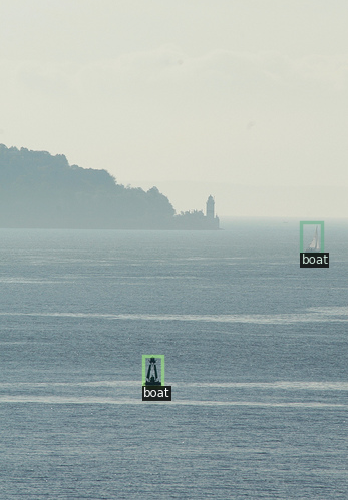

{'file_name': '/content/drive/MyDrive/cocoimages/000000477310.jpg', 'image_id': 477310, 'height': 500, 'width': 348, 'annotations': [{'bbox': [301.39, 221.97, 20.2, 32.01], 'bbox_mode': <BoxMode.XYWH_ABS: 1>, 'category_id': 1}, {'bbox': [143.24, 355.64, 19.02, 31.43], 'bbox_mode': <BoxMode.XYWH_ABS: 1>, 'category_id': 1}]}


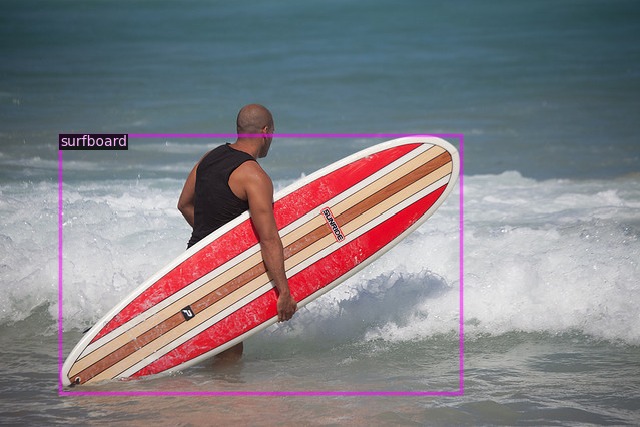

{'file_name': '/content/drive/MyDrive/cocoimages/000000460712.jpg', 'image_id': 460712, 'height': 427, 'width': 640, 'annotations': [{'bbox': [60.46, 135.34, 400.56, 257.49], 'bbox_mode': <BoxMode.XYWH_ABS: 1>, 'category_id': 4}]}


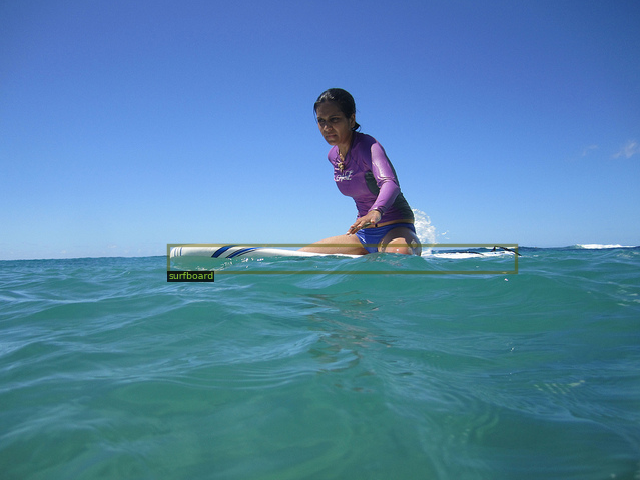

{'file_name': '/content/drive/MyDrive/cocoimages/000000143478.jpg', 'image_id': 143478, 'height': 480, 'width': 640, 'annotations': [{'bbox': [168.27, 244.66, 347.33, 26.96], 'bbox_mode': <BoxMode.XYWH_ABS: 1>, 'category_id': 4}]}


In [69]:
from detectron2.utils.visualizer import Visualizer
import cv2
from google.colab.patches import cv2_imshow
import random

sample_entries = random.sample(dataset_dicts, 3)

for d in sample_entries:
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=metadata, scale=1.0)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])
    print (d)

In [7]:
def get_test_images(img_dir):
    dataset_dicts = []
    for filename in os.listdir(img_dir):
        if filename.endswith(".jpg"):  # 假设图像文件为jpg格式
            record = {}
            record["file_name"] = os.path.join(img_dir, filename)
            record["image_id"] = filename
            record["height"] = 800  # 假设一个固定的尺寸，或者你可以读取图像获取尺寸
            record["width"] = 1200
            dataset_dicts.append(record)
    return dataset_dicts

DatasetCatalog.register("my_coco_test", lambda: get_test_images("/content/drive/My Drive/clientimages"))
MetadataCatalog.get("my_coco_test").set(thing_classes=thing_classes)

namespace(name='my_coco_test',
          thing_classes=['airplane', 'boat', 'bird', 'kite', 'surfboard'])

## Train!

Now, let's fine-tune a COCO-pretrained R50-FPN Mask R-CNN model on the balloon dataset. It takes ~2 minutes to train 300 iterations on a P100 GPU.


In [11]:
from detectron2.config import get_cfg
from detectron2 import model_zoo

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_coco_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2

# Let training initialize from model zoo
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.0025
cfg.SOLVER.MAX_ITER = 3000    # 你可以根据需要调整这个迭代次数
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # 可以调整这个值，比如从0.5提高到0.7或更高
cfg.MODEL.ROI_HEADS.NMS_THRESH_TEST = 0.5  # NMS的阈值，可根据需要调整
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(thing_classes)  # 只有5个类别

# 路径设置
cfg.OUTPUT_DIR = '/content/drive/My Drive/output'


In [12]:
from detectron2.engine import DefaultTrainer

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[04/13 17:30:26 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[04/13 17:30:50 d2.engine.train_loop]: Starting training from iteration 0


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[04/13 17:31:00 d2.utils.events]:  eta: 0:24:25  iter: 19  total_loss: 2.366  loss_cls: 1.65  loss_box_reg: 0.6157  loss_rpn_cls: 0.0124  loss_rpn_loc: 0.01326    time: 0.4765  last_time: 0.4159  data_time: 0.0328  last_data_time: 0.0113   lr: 4.9952e-05  max_mem: 3028M
[04/13 17:31:09 d2.utils.events]:  eta: 0:22:59  iter: 39  total_loss: 1.727  loss_cls: 1.021  loss_box_reg: 0.61  loss_rpn_cls: 0.0252  loss_rpn_loc: 0.01693    time: 0.4767  last_time: 0.4179  data_time: 0.0074  last_data_time: 0.0049   lr: 9.9902e-05  max_mem: 3028M
[04/13 17:31:19 d2.utils.events]:  eta: 0:23:31  iter: 59  total_loss: 1.323  loss_cls: 0.6687  loss_box_reg: 0.5851  loss_rpn_cls: 0.02319  loss_rpn_loc: 0.02754    time: 0.4803  last_time: 0.5718  data_time: 0.0071  last_data_time: 0.0141   lr: 0.00014985  max_mem: 3119M
[04/13 17:31:29 d2.utils.events]:  eta: 0:23:21  iter: 79  total_loss: 1.246  loss_cls: 0.5332  loss_box_reg: 0.6197  loss_rpn_cls: 0.0102  loss_rpn_loc: 0.01003    time: 0.4809  last_t

In [13]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir '/content/drive/My Drive/output'


<IPython.core.display.Javascript object>

[04/13 18:39:13 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-Detection/faster_rcnn_R_50_FPN_3x/137849458/model_final_280758.pkl ...


roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


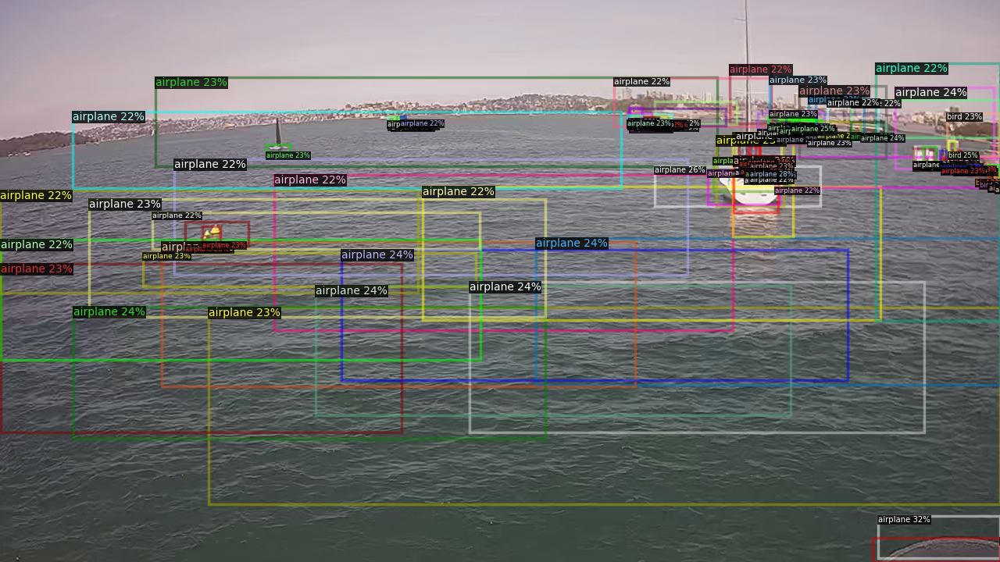

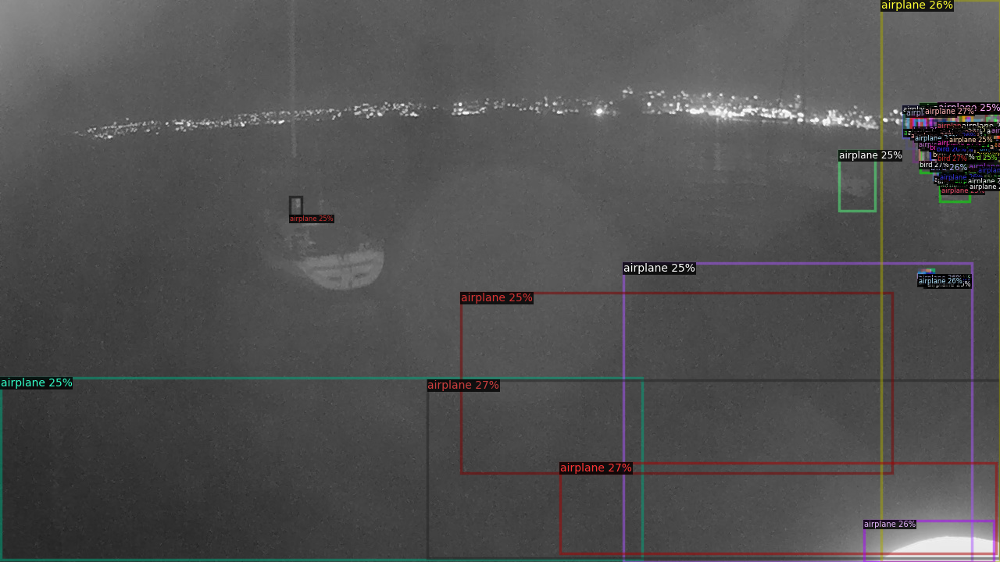

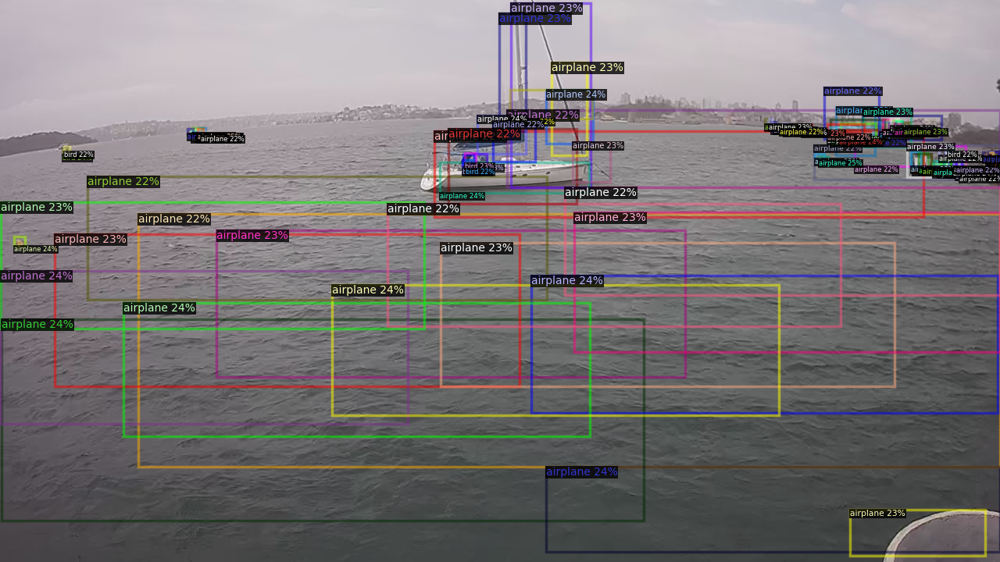

In [15]:
from detectron2.utils.visualizer import Visualizer
from detectron2.engine import DefaultPredictor
import cv2
from google.colab.patches import cv2_imshow

predictor = DefaultPredictor(cfg)

# 假设您已经有一个包含图像路径的列表
test_image_paths = ["/content/drive/MyDrive/clientimages/2021-10-09 02-35-00.jpg", "/content/drive/MyDrive/clientimages/2021-10-09 12-10-00.jpg", "/content/drive/MyDrive/clientimages/2021-10-10 01-05-00.jpg"]

for image_path in test_image_paths:
    img = cv2.imread(image_path)
    outputs = predictor(img)
    v = Visualizer(img[:, :, ::-1], metadata=MetadataCatalog.get("my_coco_train"), scale=1)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])


In [1]:
for prediction in outputs["instances"].to("cpu"):
    box = prediction.pred_boxes.tensor.numpy()[0]
    score = prediction.scores.numpy()[0]
    category = prediction.pred_classes.numpy()[0]
    if score > 0.7:  # 只绘制置信度高于0.7的预测
        cv2.rectangle(img, (int(box[0]), int(box[1])), (int(box[2]), int(box[3])), (0, 255, 0), thickness=2)
        cv2.putText(img, f'{MetadataCatalog.get("my_coco_final").thing_classes[category]}: {score:.2f}',
                    (int(box[0]), int(box[1]-10)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
cv2_imshow(img)


NameError: name 'outputs' is not defined

## Inference & evaluation using the trained model
Now, let's run inference with the trained model on the balloon validation dataset. First, let's create a predictor using the model we just trained:



In [ ]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

Then, we randomly select several samples to visualize the prediction results.

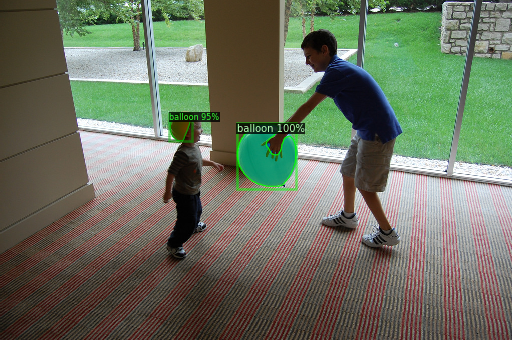

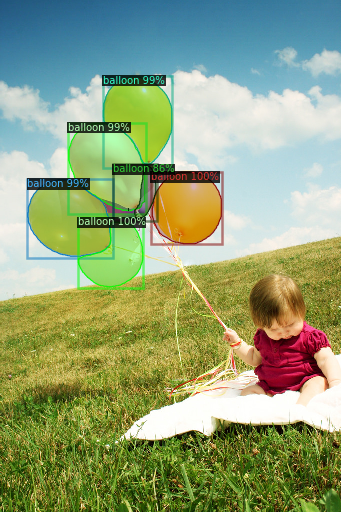

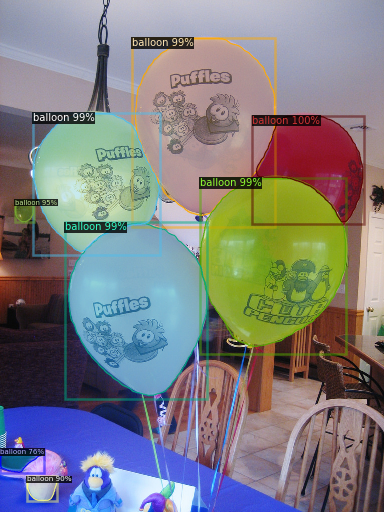

In [ ]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_balloon_dicts("balloon/val")
for d in random.sample(dataset_dicts, 3):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=balloon_metadata,
                   scale=0.5,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

We can also evaluate its performance using AP metric implemented in COCO API.
This gives an AP of ~70. Not bad!

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("balloon_val", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "balloon_val")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[09/02 02:45:11 d2.evaluation.coco_evaluation]: 'balloon_val' is not registered by `register_coco_instances`. Therefore trying to convert it to COCO format ...
[09/02 02:45:11 d2.data.datasets.coco]: Converting annotations of dataset 'balloon_val' to COCO format ...)
[09/02 02:45:11 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[09/02 02:45:11 d2.data.datasets.coco]: Conversion finished, #images: 13, #annotations: 50
[09/02 02:45:11 d2.data.datasets.coco]: Caching COCO format annotations at './output/balloon_val_coco_format.json' ...
[09/02 02:45:12 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|  balloon   | 50           |
|            |              |
[09/02 02:45:12 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[09/02 02:45:12 d2.data.common]: Serializing 13 elements to

# Other types of builtin models

We showcase simple demos of other types of models below:

WARNING [10/15 06:33:32 d2.config.compat]: Config './detectron2_repo/configs/COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml' has no VERSION. Assuming it to be compatible with latest v2.


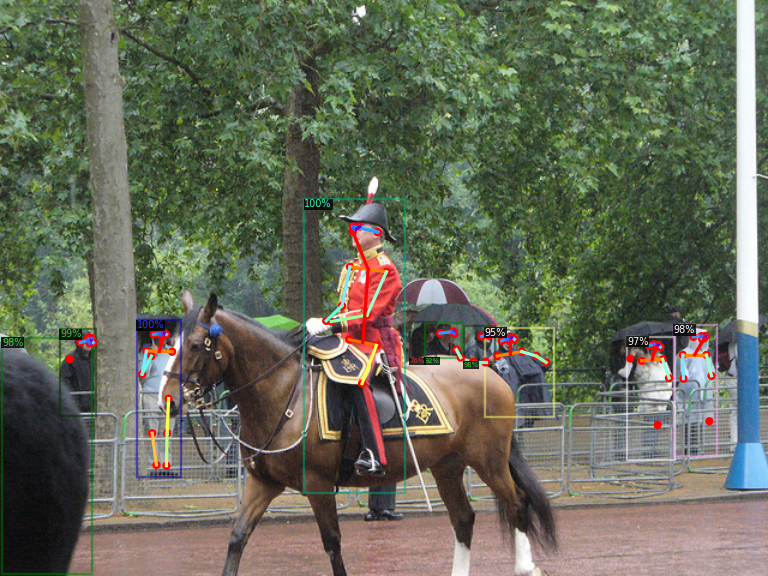

In [ ]:
# Inference with a keypoint detection model
cfg = get_cfg()   # get a fresh new config
cfg.merge_from_file(model_zoo.get_config_file("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # set threshold for this model
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(im)
v = Visualizer(im[:,:,::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

WARNING [10/15 06:33:37 d2.config.compat]: Config './detectron2_repo/configs/COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml' has no VERSION. Assuming it to be compatible with latest v2.


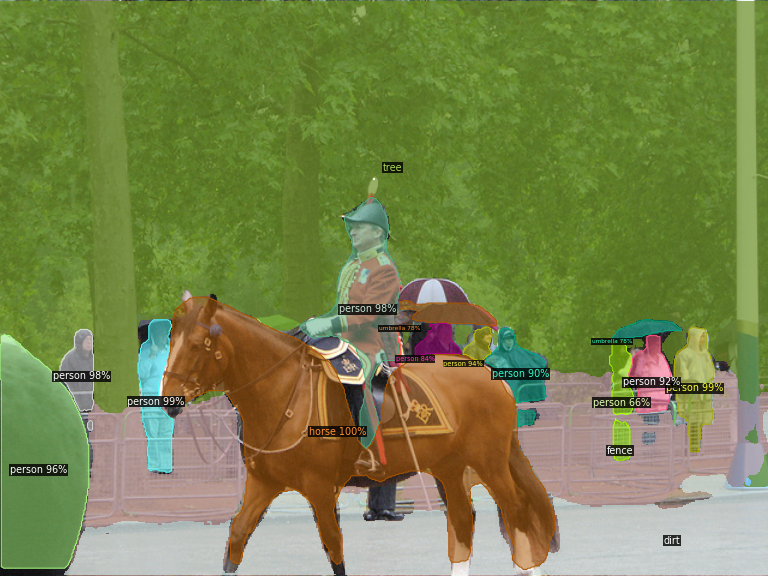

In [ ]:
# Inference with a panoptic segmentation model
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml"))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml")
predictor = DefaultPredictor(cfg)
panoptic_seg, segments_info = predictor(im)["panoptic_seg"]
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_panoptic_seg_predictions(panoptic_seg.to("cpu"), segments_info)
cv2_imshow(out.get_image()[:, :, ::-1])

# Run panoptic segmentation on a video

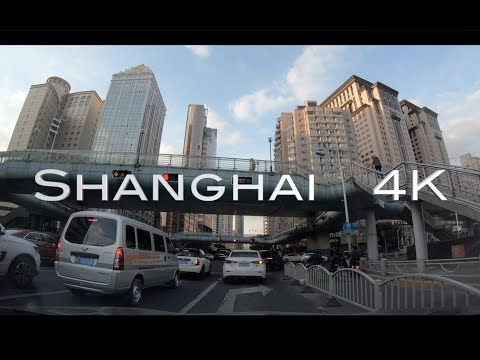

In [ ]:
# This is the video we're going to process
from IPython.display import YouTubeVideo, display
video = YouTubeVideo("ll8TgCZ0plk", width=500)
display(video)

In [ ]:
# Install dependencies, download the video, and crop 5 seconds for processing
!pip install youtube-dl
!youtube-dl https://www.youtube.com/watch?v=ll8TgCZ0plk -f 22 -o video.mp4
!ffmpeg -i video.mp4 -t 00:00:06 -c:v copy video-clip.mp4

In [ ]:
# Run frame-by-frame inference demo on this video (takes 3-4 minutes) with the "demo.py" tool we provided in the repo.
!git clone https://github.com/facebookresearch/detectron2
# Note: this is currently BROKEN due to missing codec. See https://github.com/facebookresearch/detectron2/issues/2901 for workaround.
%run detectron2/demo/demo.py --config-file detectron2/configs/COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml --video-input video-clip.mp4 --confidence-threshold 0.6 --output video-output.mkv \
  --opts MODEL.WEIGHTS detectron2://COCO-PanopticSegmentation/panoptic_fpn_R_101_3x/139514519/model_final_cafdb1.pkl

In [ ]:
# Download the results
from google.colab import files
files.download('video-output.mkv')